<a href="https://colab.research.google.com/github/Maria-Ul/urbancode_samolet/blob/main/vizualize_bboxes_with_row%2Ccol.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os
import pandas as pd
import cv2

In [2]:
import numpy as np

In [3]:
from google.colab.patches import cv2_imshow

In [4]:
label_path = '/content/drive/MyDrive/urbancode/urbanhack-train/labels_clean/0000000111building.txt'
image_path = '/content/drive/MyDrive/urbancode/urbanhack-train/images_clean/0000000111building.jpg'

In [4]:
label_path = "/content/drive/MyDrive/urbancode/urbanhack-train/labels_clean/0000000426building.txt"
image_path = "/content/drive/MyDrive/urbancode/urbanhack-train/images_clean/0000000426building.jpg"

In [5]:
f = open(label_path)
lines=f.readlines()
x_min = [max(0, float(line.split()[1]) - float(line.split()[3])/2) for line in lines]
y_min = [max(0, float(line.split()[2]) - float(line.split()[4]) /2) for line in lines]
w = [float(line.split()[3]) for line in lines]
h = [float(line.split()[4]) for line in lines]


In [6]:
data = pd.DataFrame({'x_min': x_min, 'y_min':y_min, 'w':w, 'h':h})

<Axes: xlabel='x_min', ylabel='y_min'>

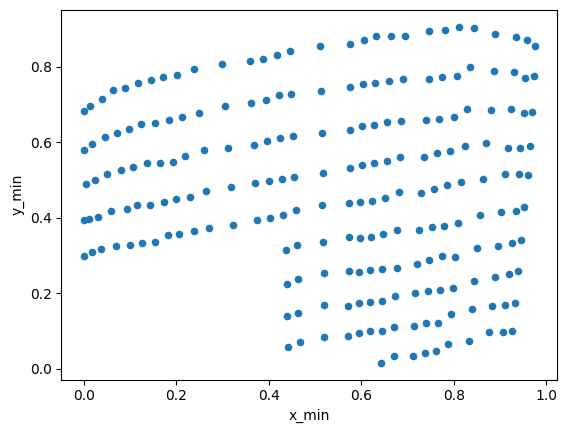

In [7]:
data.plot('x_min', 'y_min', "scatter")

In [8]:
data

,x_min,y_min,w,h
0,0.441884,0.057350,0.026112,0.083002
1,0.135275,0.546605,0.037559,0.111988
2,0.787743,0.066480,0.050729,0.082050
3,0.746976,0.894617,0.037311,0.105383
4,0.870211,0.597308,0.051388,0.093706
...,...,...,...,...
216,0.654644,0.549897,0.030119,0.100207
217,0.746998,0.287888,0.034698,0.111615
218,0.946042,0.341263,0.024314,0.078986
219,0.238726,0.795342,0.062840,0.114120


In [9]:
data.describe()

,x_min,y_min,w,h
count,221.000000,221.000000,221.000000,221.000000
mean,0.547662,0.478480,0.037267,0.103908
std,0.290049,0.236283,0.011858,0.012883
min,0.000059,0.016211,0.013839,0.074700
25%,0.317678,0.308344,0.028299,0.095694
50%,0.602538,0.486128,0.033790,0.103892
75%,0.780421,0.666894,0.046156,0.114306
max,0.974978,0.906108,0.064590,0.129462


In [10]:
data.describe()['h']['mean']

0.10390849909502263

In [11]:
img = cv2.imread(image_path)

In [12]:
delta_x = data.describe()['w']['mean']

In [13]:
delta_y = data.describe()['h']['mean']

In [14]:
bbox_points = [(x_min[i], y_min[i]) for i in range(len(x_min))]

# first algorithm

In [ ]:
# Define your input points (x, y) and precision values


# Sort points by y-coordinate
sorted_points = sorted(points, key=lambda point: point[1])

# Initialize variables for grouping
current_row = []
rows = []

# Group points into rows based on delta_y
for point in sorted_points:
    if not current_row or abs(point[1] - current_row[0][1]) <= delta_y:
        current_row.append(point)
    else:
        rows.append(current_row)
        current_row = [point]

# Append the last row
if current_row:
    rows.append(current_row)

# Sort each row by x-coordinate
sorted_rows = [sorted(row, key=lambda point: point[0]) for row in rows]

# Create a dictionary to store the final matrix
matrix = {}

# Enumerate the matrix elements
for row_index, row in enumerate(sorted_rows):
    start_column = 1
    for point in row:
        while (start_column, row_index + 1) in matrix:
            start_column += 1
        matrix[(start_column, row_index + 1)] = point

# Determine the maximum number of columns for matrix formatting
max_columns = max([key[0] for key in matrix.keys()])

# Print the matrix
matrix_with_points = []
for i in range(1, max_columns + 1):
    row_elements = [matrix.get((i, j), None) for j in range(1, len(sorted_rows) + 1)]
    matrix_with_points.append(row_elements)
    print(row_elements)


[(0.48178765, 0.12503465), (0.16529939999999999, 0.17899305), (0.0190653, 0.20755205), (0.014337500000000001, 0.30093745), (0.0118874, 0.3469965), (0.009283050000000001, 0.39244795000000005), (0.0077132, 0.4395659), (0.0049908500000000015, 0.49258675), (0.00018149999999999937, 0.59027775), (0, 0.6951041499999999), (0, 0.75024305), (0, 0.80317705), (0.013121550000000003, 0.8560068999999999), (0.192196, 0.8814409)]
[(0.5124319, 0.12154509999999999), (0.20542645, 0.17008675), (0.0378312, 0.24782984999999996), (0.017604349999999998, 0.2526215), (0.03378395000000001, 0.34387155), (0.0307622, 0.39041665), (0.0290925, 0.44024304999999997), (0.0246642, 0.53909715), (0.0034663999999999997, 0.5425694), (0.00023584999999999925, 0.6430555), (0.016851199999999997, 0.7493923), (0.0142831, 0.80451385), (0.0629582, 0.8599132), (0.2527586, 0.8812326)]
[(0.54666055, 0.11498264999999999), (0.26362975, 0.16050345), (0.039990899999999996, 0.2045139), (0.036506300000000005, 0.2970833), (0.0829219, 0.3384548

In [ ]:
matrix_with_points[0]

[(0.48178765, 0.12503465),
 (0.16529939999999999, 0.17899305),
 (0.0190653, 0.20755205),
 (0.014337500000000001, 0.30093745),
 (0.0118874, 0.3469965),
 (0.009283050000000001, 0.39244795000000005),
 (0.0077132, 0.4395659),
 (0.0049908500000000015, 0.49258675),
 (0.00018149999999999937, 0.59027775),
 (0, 0.6951041499999999),
 (0, 0.75024305),
 (0, 0.80317705),
 (0.013121550000000003, 0.8560068999999999),
 (0.192196, 0.8814409)]

In [ ]:
points = pd.DataFrame(matrix_with_points).T

In [ ]:
points

,0,1,2,3,4,5,6,7,8,9,...,36,37,38,39,40,41,42,43,44,45
0,"(0.4058984, 0.13515625)","(0.45323955, 0.12913185)","(0.48178765, 0.12503465)","(0.5124319, 0.12154509999999999)","(0.54666055, 0.11498264999999999)","(0.58255895, 0.10970485)","(0.6165336, 0.10821175)","(0.653902, 0.09994785)","(0.68772235, 0.0961805)","(0.7233303, 0.09013885)",...,None,None,None,None,None,None,None,None,None,None
1,"(0.0190653, 0.20755205)","(0.039990899999999996, 0.2045139)","(0.08803989999999999, 0.1932986)","(0.11380214999999999, 0.19074655000000001)","(0.16529939999999999, 0.17899305)","(0.2034664, 0.21906245)","(0.20542645, 0.17008675)","(0.2625408, 0.21024299999999999)","(0.26362975, 0.16050345)","(0.29128855, 0.2038889)",...,None,None,None,None,None,None,None,None,None,None
2,"(0.014337500000000001, 0.30093745)","(0.017604349999999998, 0.2526215)","(0.036506300000000005, 0.2970833)","(0.0378312, 0.24782984999999996)","(0.08314875000000001, 0.28647565)","(0.0855807, 0.23973955)","(0.1095462, 0.28385419999999995)","(0.11045375000000002, 0.23628475)","(0.1635209, 0.27342004999999997)","(0.1646098, 0.2259027)",...,None,None,None,None,None,None,None,None,None,None
3,"(0.0118874, 0.3469965)","(0.03378395000000001, 0.34387155)","(0.0829219, 0.3384548)","(0.10848455, 0.3335243)","(0.16070775, 0.3757639)","(0.1627586, 0.32583335)","(0.1996461, 0.3729514)","(0.20254985, 0.3222222)","(0.26169689999999995, 0.3655729)","(0.26169695, 0.31314230000000004)",...,None,None,None,None,None,None,None,None,None,None
4,"(0.0077132, 0.4395659)","(0.009283050000000001, 0.39244795000000005)","(0.0290925, 0.44024304999999997)","(0.0307622, 0.39041665)","(0.07795825, 0.43553814999999996)","(0.07943739999999999, 0.38465269999999996)","(0.10452810000000001, 0.3853125)","(0.10467335000000001, 0.4346007)","(0.1590744, 0.4299479)","(0.19877495, 0.4261284)",...,"(0.9201996, 0.44461805)",None,None,None,None,None,None,None,None,None
5,"(0.0049908500000000015, 0.49258675)","(0.0246642, 0.53909715)","(0.027132450000000002, 0.48897565000000004)","(0.07450995, 0.5383854)","(0.07570775, 0.48453125)","(0.1023502, 0.48454860000000005)","(0.1573502, 0.5373437)","(0.1577132, 0.4839583)","(0.197568, 0.5378472000000001)","(0.19911065, 0.47986105)",...,None,None,None,None,None,None,None,None,None,None
6,"(0.00018149999999999937, 0.59027775)","(0.0034663999999999997, 0.5425694)","(0.0236207, 0.59081595)","(0.07270415, 0.58970485)","(0.1001724, 0.5897222)","(0.10094375000000001, 0.5396875000000001)","(0.15480945000000002, 0.5891146)","(0.19635205, 0.58749995)","(0.26005445, 0.5857985499999999)","(0.29087114999999997, 0.5838888999999999)",...,None,None,None,None,None,None,None,None,None,None
7,"(0, 0.6951041499999999)","(0.00023584999999999925, 0.6430555)","(0.01911065, 0.69404515)","(0.02094375, 0.6433506999999999)","(0.06950995, 0.6984548)","(0.07200535, 0.6451736499999999)","(0.0948548, 0.7006597)","(0.0977767, 0.6439756999999999)","(0.15154265, 0.7013889)","(0.15390195, 0.6464236000000001)",...,"(0.7115063500000001, 0.6400173499999999)","(0.7153539, 0.7054166000000001)","(0.7508620500000001, 0.64140625)","(0.755372, 0.705625)","(0.7933394, 0.6423785)","(0.79647915, 0.70616315)","(0.8552631, 0.6405208)","(0.8599092500000001, 0.7092708)","(0.9364519, 0.6384375000000001)","(0.9439292, 0.71378465)"
8,"(0, 0.75024305)","(0, 0.80317705)","(0.0142831, 0.80451385)","(0.016851199999999997, 0.7493923)","(0.06637025, 0.80710065)","(0.06777675, 0.7527951500000001)","(0.09343005, 0.8127430499999999)","(0.09467335, 0.75725685)","(0.1494555, 0.81434025)","(0.15054445, 0.75989585)",...,None,None,None,None,None,None,None,None,None,None
9,"(0.013121550000000003, 0.8560068999999999)","(0.0629582, 0.8599132)","(0.09032665, 0.86538195)","(0.1495463, 0.8739409499999999)","(0.192196, 0.8814409)","(0.2527586, 0.8812326)","(0.29033575, 0.8838368)","(0.31908349999999996, 0.88565965)","(0.35112525, 0.8838368)","(0.41387475, 0.89321175)",...,None,None,None,None,None,None,None,None,None,None


In [ ]:
# ... (Previous code for grouping and sorting points)

# Create a dictionary to store the final matrix with (row, column) positions
matrix_pos = {}

# Enumerate the matrix elements and assign (row, column) positions
for row_index, row in enumerate(sorted_rows):
    start_column = 1
    for point in row:
        while (row_index + 1, start_column) in matrix_pos:
            start_column += 1
        matrix_pos[(row_index + 1, start_column)] = point

# Determine the maximum number of rows and columns for matrix formatting
max_rows = len(sorted_rows)
max_columns = max([key[1] for key in matrix_pos.keys()])

# Create the matrix and initialize with None
final_matrix = [[None] * max_columns for _ in range(max_rows)]

# Fill the matrix with (row, column) positions
for (row, column), point in matrix_pos.items():
    final_matrix[row - 1][column - 1] = (row, column)

# Print the matrix with (row, column) positions
for row in final_matrix:
    print(row)


[(1, 1), (1, 2), (1, 3), (1, 4), (1, 5), (1, 6), (1, 7), (1, 8), (1, 9), (1, 10), (1, 11), (1, 12), (1, 13), (1, 14), (1, 15), (1, 16), None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None]
[(2, 1), (2, 2), (2, 3), (2, 4), (2, 5), (2, 6), (2, 7), (2, 8), (2, 9), (2, 10), (2, 11), (2, 12), (2, 13), (2, 14), (2, 15), (2, 16), (2, 17), (2, 18), (2, 19), (2, 20), (2, 21), (2, 22), (2, 23), (2, 24), (2, 25), (2, 26), (2, 27), (2, 28), (2, 29), (2, 30), (2, 31), (2, 32), (2, 33), None, None, None, None, None, None, None, None, None, None, None, None, None]
[(3, 1), (3, 2), (3, 3), (3, 4), (3, 5), (3, 6), (3, 7), (3, 8), (3, 9), (3, 10), (3, 11), (3, 12), (3, 13), (3, 14), (3, 15), (3, 16), (3, 17), (3, 18), (3, 19), (3, 20), (3, 21), (3, 22), (3, 23), (3, 24), (3, 25), (3, 26), (3, 27), (3, 28), (3, 29), (3, 30), (3, 31), (3, 32), (3, 33), None, None, None, None, None

In [ ]:
matrix_frame = pd.DataFrame(final_matrix)

In [ ]:
matrix_frame

,0,1,2,3,4,5,6,7,8,9,...,36,37,38,39,40,41,42,43,44,45
0,"(1, 1)","(1, 2)","(1, 3)","(1, 4)","(1, 5)","(1, 6)","(1, 7)","(1, 8)","(1, 9)","(1, 10)",...,None,None,None,None,None,None,None,None,None,None
1,"(2, 1)","(2, 2)","(2, 3)","(2, 4)","(2, 5)","(2, 6)","(2, 7)","(2, 8)","(2, 9)","(2, 10)",...,None,None,None,None,None,None,None,None,None,None
2,"(3, 1)","(3, 2)","(3, 3)","(3, 4)","(3, 5)","(3, 6)","(3, 7)","(3, 8)","(3, 9)","(3, 10)",...,None,None,None,None,None,None,None,None,None,None
3,"(4, 1)","(4, 2)","(4, 3)","(4, 4)","(4, 5)","(4, 6)","(4, 7)","(4, 8)","(4, 9)","(4, 10)",...,None,None,None,None,None,None,None,None,None,None
4,"(5, 1)","(5, 2)","(5, 3)","(5, 4)","(5, 5)","(5, 6)","(5, 7)","(5, 8)","(5, 9)","(5, 10)",...,"(5, 37)",None,None,None,None,None,None,None,None,None
5,"(6, 1)","(6, 2)","(6, 3)","(6, 4)","(6, 5)","(6, 6)","(6, 7)","(6, 8)","(6, 9)","(6, 10)",...,None,None,None,None,None,None,None,None,None,None
6,"(7, 1)","(7, 2)","(7, 3)","(7, 4)","(7, 5)","(7, 6)","(7, 7)","(7, 8)","(7, 9)","(7, 10)",...,None,None,None,None,None,None,None,None,None,None
7,"(8, 1)","(8, 2)","(8, 3)","(8, 4)","(8, 5)","(8, 6)","(8, 7)","(8, 8)","(8, 9)","(8, 10)",...,"(8, 37)","(8, 38)","(8, 39)","(8, 40)","(8, 41)","(8, 42)","(8, 43)","(8, 44)","(8, 45)","(8, 46)"
8,"(9, 1)","(9, 2)","(9, 3)","(9, 4)","(9, 5)","(9, 6)","(9, 7)","(9, 8)","(9, 9)","(9, 10)",...,None,None,None,None,None,None,None,None,None,None
9,"(10, 1)","(10, 2)","(10, 3)","(10, 4)","(10, 5)","(10, 6)","(10, 7)","(10, 8)","(10, 9)","(10, 10)",...,None,None,None,None,None,None,None,None,None,None


# vizualization

In [ ]:
img = cv2.imread(image_path)

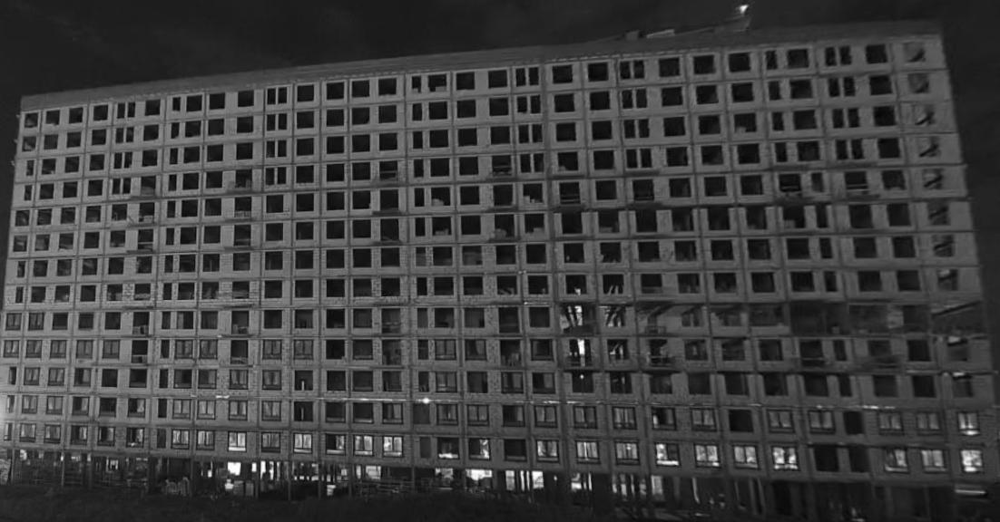

In [ ]:
cv2_imshow(img)

In [ ]:
points

,0,1,2,3,4,5,6,7,8,9,...,36,37,38,39,40,41,42,43,44,45
0,"(0.4058984, 0.13515625)","(0.45323955, 0.12913185)","(0.48178765, 0.12503465)","(0.5124319, 0.12154509999999999)","(0.54666055, 0.11498264999999999)","(0.58255895, 0.10970485)","(0.6165336, 0.10821175)","(0.653902, 0.09994785)","(0.68772235, 0.0961805)","(0.7233303, 0.09013885)",...,None,None,None,None,None,None,None,None,None,None
1,"(0.0190653, 0.20755205)","(0.039990899999999996, 0.2045139)","(0.08803989999999999, 0.1932986)","(0.11380214999999999, 0.19074655000000001)","(0.16529939999999999, 0.17899305)","(0.2034664, 0.21906245)","(0.20542645, 0.17008675)","(0.2625408, 0.21024299999999999)","(0.26362975, 0.16050345)","(0.29128855, 0.2038889)",...,None,None,None,None,None,None,None,None,None,None
2,"(0.014337500000000001, 0.30093745)","(0.017604349999999998, 0.2526215)","(0.036506300000000005, 0.2970833)","(0.0378312, 0.24782984999999996)","(0.08314875000000001, 0.28647565)","(0.0855807, 0.23973955)","(0.1095462, 0.28385419999999995)","(0.11045375000000002, 0.23628475)","(0.1635209, 0.27342004999999997)","(0.1646098, 0.2259027)",...,None,None,None,None,None,None,None,None,None,None
3,"(0.0118874, 0.3469965)","(0.03378395000000001, 0.34387155)","(0.0829219, 0.3384548)","(0.10848455, 0.3335243)","(0.16070775, 0.3757639)","(0.1627586, 0.32583335)","(0.1996461, 0.3729514)","(0.20254985, 0.3222222)","(0.26169689999999995, 0.3655729)","(0.26169695, 0.31314230000000004)",...,None,None,None,None,None,None,None,None,None,None
4,"(0.0077132, 0.4395659)","(0.009283050000000001, 0.39244795000000005)","(0.0290925, 0.44024304999999997)","(0.0307622, 0.39041665)","(0.07795825, 0.43553814999999996)","(0.07943739999999999, 0.38465269999999996)","(0.10452810000000001, 0.3853125)","(0.10467335000000001, 0.4346007)","(0.1590744, 0.4299479)","(0.19877495, 0.4261284)",...,"(0.9201996, 0.44461805)",None,None,None,None,None,None,None,None,None
5,"(0.0049908500000000015, 0.49258675)","(0.0246642, 0.53909715)","(0.027132450000000002, 0.48897565000000004)","(0.07450995, 0.5383854)","(0.07570775, 0.48453125)","(0.1023502, 0.48454860000000005)","(0.1573502, 0.5373437)","(0.1577132, 0.4839583)","(0.197568, 0.5378472000000001)","(0.19911065, 0.47986105)",...,None,None,None,None,None,None,None,None,None,None
6,"(0.00018149999999999937, 0.59027775)","(0.0034663999999999997, 0.5425694)","(0.0236207, 0.59081595)","(0.07270415, 0.58970485)","(0.1001724, 0.5897222)","(0.10094375000000001, 0.5396875000000001)","(0.15480945000000002, 0.5891146)","(0.19635205, 0.58749995)","(0.26005445, 0.5857985499999999)","(0.29087114999999997, 0.5838888999999999)",...,None,None,None,None,None,None,None,None,None,None
7,"(0, 0.6951041499999999)","(0.00023584999999999925, 0.6430555)","(0.01911065, 0.69404515)","(0.02094375, 0.6433506999999999)","(0.06950995, 0.6984548)","(0.07200535, 0.6451736499999999)","(0.0948548, 0.7006597)","(0.0977767, 0.6439756999999999)","(0.15154265, 0.7013889)","(0.15390195, 0.6464236000000001)",...,"(0.7115063500000001, 0.6400173499999999)","(0.7153539, 0.7054166000000001)","(0.7508620500000001, 0.64140625)","(0.755372, 0.705625)","(0.7933394, 0.6423785)","(0.79647915, 0.70616315)","(0.8552631, 0.6405208)","(0.8599092500000001, 0.7092708)","(0.9364519, 0.6384375000000001)","(0.9439292, 0.71378465)"
8,"(0, 0.75024305)","(0, 0.80317705)","(0.0142831, 0.80451385)","(0.016851199999999997, 0.7493923)","(0.06637025, 0.80710065)","(0.06777675, 0.7527951500000001)","(0.09343005, 0.8127430499999999)","(0.09467335, 0.75725685)","(0.1494555, 0.81434025)","(0.15054445, 0.75989585)",...,None,None,None,None,None,None,None,None,None,None
9,"(0.013121550000000003, 0.8560068999999999)","(0.0629582, 0.8599132)","(0.09032665, 0.86538195)","(0.1495463, 0.8739409499999999)","(0.192196, 0.8814409)","(0.2527586, 0.8812326)","(0.29033575, 0.8838368)","(0.31908349999999996, 0.88565965)","(0.35112525, 0.8838368)","(0.41387475, 0.89321175)",...,None,None,None,None,None,None,None,None,None,None


In [ ]:
matrix_frame

,0,1,2,3,4,5,6,7,8,9,...,36,37,38,39,40,41,42,43,44,45
0,"(1, 1)","(1, 2)","(1, 3)","(1, 4)","(1, 5)","(1, 6)","(1, 7)","(1, 8)","(1, 9)","(1, 10)",...,None,None,None,None,None,None,None,None,None,None
1,"(2, 1)","(2, 2)","(2, 3)","(2, 4)","(2, 5)","(2, 6)","(2, 7)","(2, 8)","(2, 9)","(2, 10)",...,None,None,None,None,None,None,None,None,None,None
2,"(3, 1)","(3, 2)","(3, 3)","(3, 4)","(3, 5)","(3, 6)","(3, 7)","(3, 8)","(3, 9)","(3, 10)",...,None,None,None,None,None,None,None,None,None,None
3,"(4, 1)","(4, 2)","(4, 3)","(4, 4)","(4, 5)","(4, 6)","(4, 7)","(4, 8)","(4, 9)","(4, 10)",...,None,None,None,None,None,None,None,None,None,None
4,"(5, 1)","(5, 2)","(5, 3)","(5, 4)","(5, 5)","(5, 6)","(5, 7)","(5, 8)","(5, 9)","(5, 10)",...,"(5, 37)",None,None,None,None,None,None,None,None,None
5,"(6, 1)","(6, 2)","(6, 3)","(6, 4)","(6, 5)","(6, 6)","(6, 7)","(6, 8)","(6, 9)","(6, 10)",...,None,None,None,None,None,None,None,None,None,None
6,"(7, 1)","(7, 2)","(7, 3)","(7, 4)","(7, 5)","(7, 6)","(7, 7)","(7, 8)","(7, 9)","(7, 10)",...,None,None,None,None,None,None,None,None,None,None
7,"(8, 1)","(8, 2)","(8, 3)","(8, 4)","(8, 5)","(8, 6)","(8, 7)","(8, 8)","(8, 9)","(8, 10)",...,"(8, 37)","(8, 38)","(8, 39)","(8, 40)","(8, 41)","(8, 42)","(8, 43)","(8, 44)","(8, 45)","(8, 46)"
8,"(9, 1)","(9, 2)","(9, 3)","(9, 4)","(9, 5)","(9, 6)","(9, 7)","(9, 8)","(9, 9)","(9, 10)",...,None,None,None,None,None,None,None,None,None,None
9,"(10, 1)","(10, 2)","(10, 3)","(10, 4)","(10, 5)","(10, 6)","(10, 7)","(10, 8)","(10, 9)","(10, 10)",...,None,None,None,None,None,None,None,None,None,None


In [ ]:
points_arr = np.array(points)

In [ ]:
points_arr.shape

(11, 46)

In [ ]:
points_arr[0][0]

(0.4058984, 0.13515625)

In [ ]:
len(points_arr)

11

In [ ]:
len(points_arr[0])

46

In [ ]:
matrix_arr = np.array(matrix_frame)

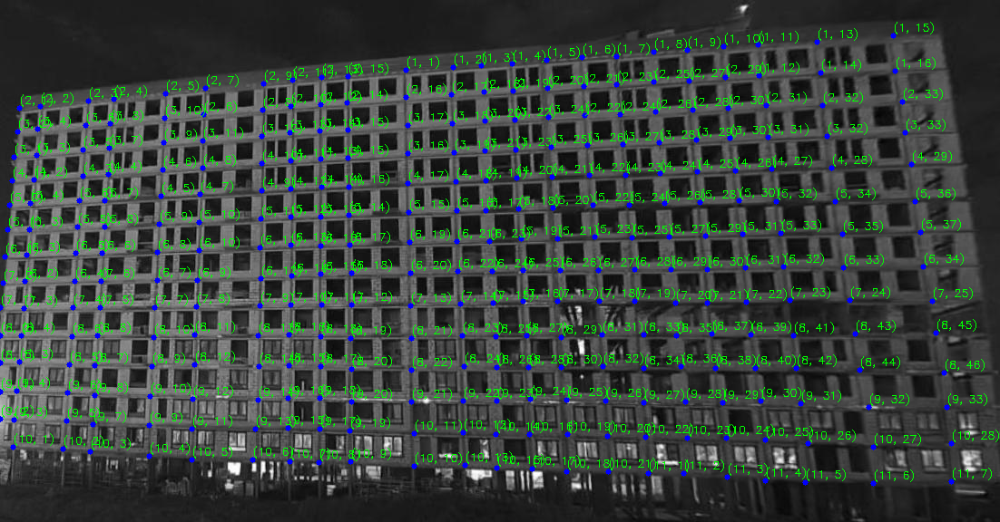

In [ ]:
image_with_points = img.copy()
for row in range(points_arr.shape[0]):
  for column in range(points_arr.shape[1]):
    if (points_arr[row][column]!=None):
      x, y = points_arr[row][column]
      x,y = (int(x*image_with_points.shape[1]),int(y*image_with_points.shape[0]))
      label = str(matrix_arr[row][column])
      cv2.putText(image_with_points, label, (x, y-5), cv2.FONT_HERSHEY_SIMPLEX, 0.4, (0,255,0), 1)

      image_with_points = cv2.circle(image_with_points,(x,y), radius = 3, color = (255,0,0), thickness=-1)
cv2_imshow(image_with_points)

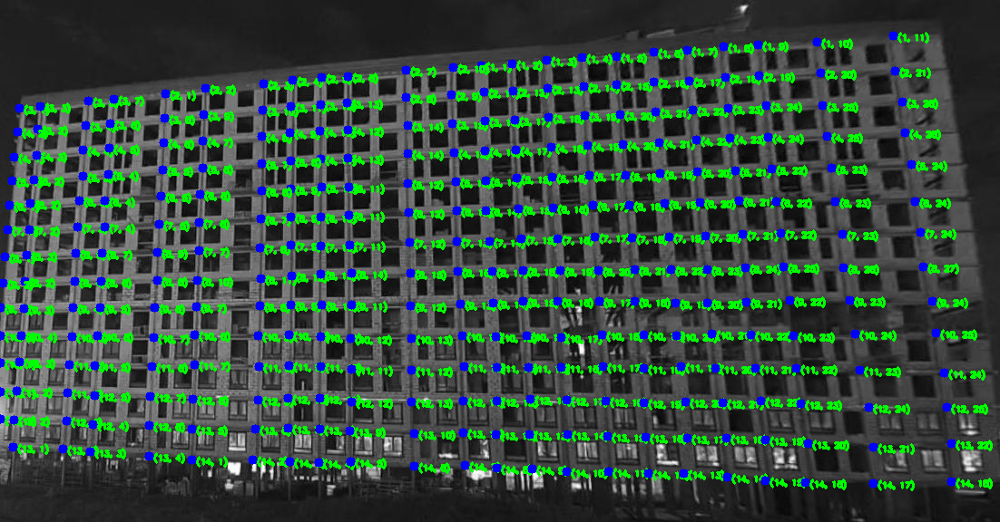

# second algorithm

---



In [ ]:
widths = w
heights = h

In [ ]:
widths[0]

105

In [ ]:
# # Define your input points (x, y) and precision values
# points = [(300, 150), (300, 100), (200, 149)]
# width = 100
# height = 50
# # Sort points by y-coordinate
# sorted_points = sorted(points, key=lambda point: point[1])
# print("sorted points ", sorted_points)
# # Initialize variables for grouping
# current_row = []
# rows = []

# # Group points into rows based on delta_y
# for (i, point) in enumerate(sorted_points):
#     # print("point ", point, "\n")
#     # print("current_row ", current_row, "\n")
#     if not current_row or abs(point[1] - current_row[-1][1]) <= height/2:
#         # print("current_row.append(point)\n")
#         current_row.append(point)
#     else:
#         # print("rows.append(current_row)\n")
#         rows.append(current_row)
#         current_row = [point]

# # Append the last row
# if current_row:
#     rows.append(current_row)

# print("rows\n", rows)

# # Sort each row by x-coordinate
# sorted_rows = [sorted(row, key=lambda point: point[0]) for row in rows]
# print("sorted_rows\n", sorted_rows)

# # Create a dictionary to store the final matrix
# matrix = {}

# # Enumerate the matrix elements
# for row_index, row in enumerate(sorted_rows):
#     start_column = 1
#     for point in row:
#         while (start_column, row_index + 1) in matrix:
#             start_column += 1
#         matrix[(start_column, row_index + 1)] = point
# print("matrix\n ", matrix)
# # Determine the maximum number of columns for matrix formatting
# max_columns = max([key[1] for key in matrix.keys()])

# # Print the matrix
# matrix_with_points = []
# for i in range(1, max_columns + 1):
#     row_elements = [matrix.get((j, i), None) for j in range(1, len(sorted_rows) + 1)]
#     matrix_with_points.append(row_elements)
#     print(row_elements)


sorted points  [(300, 100), (200, 149), (300, 150)]
rows
 [[(300, 100)], [(200, 149), (300, 150)]]
sorted_rows
 [[(300, 100)], [(200, 149), (300, 150)]]
matrix
  {(1, 1): (300, 100), (1, 2): (200, 149), (2, 2): (300, 150)}
[(300, 100), None]
[(200, 149), (300, 150)]


In [ ]:
# Define your input points (x, y) and precision values
points = points
width = delta_x
height = delta_y

# Sort points by y-coordinate
sorted_points = sorted(points, key=lambda point: point[1])

# Initialize variables for grouping
current_row = []
rows = []

# Group points into rows based on delta_y
for point in sorted_points:
    # print("point \n",  point)
    # print("curr row\n", current_row)
    if not(current_row) or (abs(point[1] - current_row[-1][1]) <= height and abs(point[0] - current_row[-1][0]) <= width):
        # print("add in row\n")
        current_row.append(point)
    else:
        # print("current_row[-1] ",current_row[-1])
        # print("abs(point[1] - current_row[-1][1]) ", abs(point[1] - current_row[-1][1]))
        # print("abs(point[0] - current_row[-1][0]) ", abs(point[0] - current_row[-1][0]))
        # print("start new row\n")
        # print("current_row ",len(current_row))
        rows.append(current_row)
        current_row = [point]
        # break


# Append the last row
if current_row:
    rows.append(current_row)
print(len(rows))


# Sort each row by x-coordinate
sorted_rows = [sorted(row, key=lambda point: point[0]) for row in rows]

# Create a dictionary to store the final matrix
matrix = {}

# Enumerate the matrix elements
for row_index, row in enumerate(sorted_rows):
    start_column = 1
    for point in row:
        while (start_column, row_index + 1) in matrix:
            start_column += 1
        matrix[(start_column, row_index + 1)] = point

# Determine the maximum number of columns for matrix formatting
max_columns = max([key[1] for key in matrix.keys()])

# Print the matrix
matrix_with_points = []
for i in range(1, max_columns + 1):
    row_elements = [matrix.get((j, i), None) for j in range(1, len(sorted_rows) + 1)]
    matrix_with_points.append(row_elements)
    print(row_elements)


158
[(0.4058984, 0.13515625), (0.45323955, 0.12913185), (0.48178765, 0.12503465), (0.5124319, 0.12154509999999999), (0.54666055, 0.11498264999999999), (0.58255895, 0.10970485), (0.6165336, 0.10821175), (0.653902, 0.09994785), (0.68772235, 0.0961805), (0.7233303, 0.09013885), (0.7583574999999999, 0.0859375), (0.81676945, 0.08032985000000001), (0.89352995, 0.06892365), None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, 

In [ ]:
len(rows)

158

In [ ]:
width

0.0816243

In [ ]:
height

0.0774131

In [13]:
image_with_points = img.copy()
for point in rows[0]:
  x, y = point
  x,y = int(x*image_with_points.shape[1]), int(y*image_with_points.shape[0])
  image_with_points = cv2.circle(image_with_points, (x,y), radius = 3, color = (255,0,0), thickness=-1)
cv2_imshow(image_with_points)

NameError: ignored

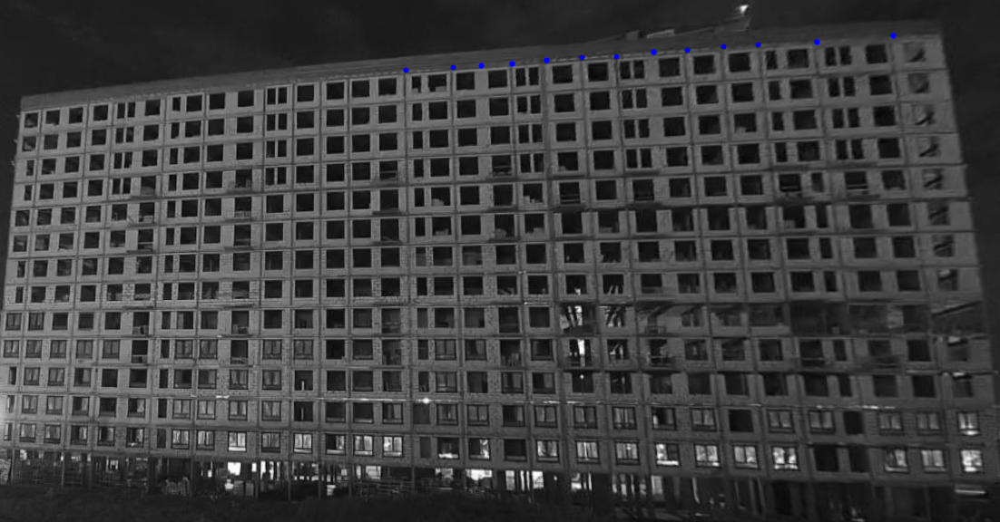

In [ ]:
image_with_points = cv2.circle(image_with_points, (int(0.89352995*image_with_points.shape[1]), int(0.06892365*image_with_points.shape[0])), radius = 3, color = (255,0,0), thickness=-1)
cv2_imshow(image_with_points)

In [ ]:
matrix_with_points[0]

In [ ]:
points = pd.DataFrame(matrix_with_points)

In [ ]:
points

In [ ]:
# ... (Previous code for grouping and sorting points)

# Create a dictionary to store the final matrix with (row, column) positions
matrix_pos = {}

# Enumerate the matrix elements and assign (row, column) positions
for row_index, row in enumerate(sorted_rows):
    start_column = 1
    for point in row:
        while (row_index + 1, start_column) in matrix_pos:
            start_column += 1
        matrix_pos[(row_index + 1, start_column)] = point

# Determine the maximum number of rows and columns for matrix formatting
max_rows = len(sorted_rows)
max_columns = max([key[1] for key in matrix_pos.keys()])

# Create the matrix and initialize with None
final_matrix = [[None] * max_columns for _ in range(max_rows)]

# Fill the matrix with (row, column) positions
for (row, column), point in matrix_pos.items():
    final_matrix[row - 1][column - 1] = (row, column)

# Print the matrix with (row, column) positions
for row in final_matrix:
    print(row)


In [ ]:
matrix_frame = pd.DataFrame(final_matrix)

In [ ]:
matrix_frame

# vizualization

In [ ]:
img = cv2.imread(image_path)

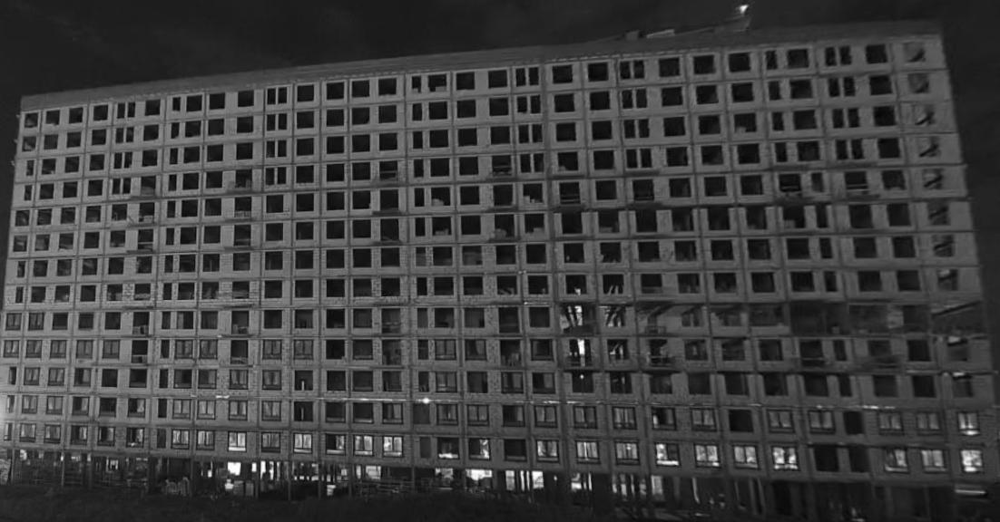

In [ ]:
cv2_imshow(img)

In [ ]:

points

,0,1,2,3,4,5,6,7,8,9,...,148,149,150,151,152,153,154,155,156,157
0,"(0.4058984, 0.13515625)","(0.45323955, 0.12913185)","(0.48178765, 0.12503465)","(0.5124319, 0.12154509999999999)","(0.54666055, 0.11498264999999999)","(0.58255895, 0.10970485)","(0.6165336, 0.10821175)","(0.653902, 0.09994785)","(0.68772235, 0.0961805)","(0.7233303, 0.09013885)",...,None,None,None,None,None,None,None,None,None,None
1,"(0.75916515, 0.14454865)","(0.82055345, 0.1403993)","(0.8953176, 0.13628465)",None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
2,"(0.34790375, 0.1475173)",None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
3,"(0.72506355, 0.1484028)",None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
4,"(0.29279495, 0.15322914999999998)","(0.32132485, 0.14857635)",None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
153,"(0.29033575, 0.8838368)","(0.31908349999999996, 0.88565965)","(0.35112525, 0.8838368)",None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
154,"(0.41387475, 0.89321175)","(0.46509975, 0.8915971500000001)",None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
155,"(0.4969328, 0.895868)","(0.53179675, 0.8989062)","(0.5663521, 0.9029513499999999)","(0.6082486500000001, 0.90345485)","(0.6486569, 0.9078297999999999)","(0.6838021, 0.9076562)","(0.72699635, 0.9144444)","(0.76547185, 0.9202604)",None,None,...,None,None,None,None,None,None,None,None,None,None
156,"(0.9516061, 0.9235243000000001)",None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None


In [ ]:
matrix_frame

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,"(1, 1)","(1, 2)","(1, 3)","(1, 4)","(1, 5)","(1, 6)","(1, 7)","(1, 8)","(1, 9)","(1, 10)","(1, 11)","(1, 12)","(1, 13)",None,None,None,None
1,"(2, 1)","(2, 2)","(2, 3)",None,None,None,None,None,None,None,None,None,None,None,None,None,None
2,"(3, 1)",None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
3,"(4, 1)",None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
4,"(5, 1)","(5, 2)",None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
153,"(154, 1)","(154, 2)","(154, 3)",None,None,None,None,None,None,None,None,None,None,None,None,None,None
154,"(155, 1)","(155, 2)",None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
155,"(156, 1)","(156, 2)","(156, 3)","(156, 4)","(156, 5)","(156, 6)","(156, 7)","(156, 8)",None,None,None,None,None,None,None,None,None
156,"(157, 1)",None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None


In [ ]:
points_arr = np.array(points)

In [ ]:
points_arr.shape

(158, 158)

In [ ]:
points_arr[0][0]

(0.4058984, 0.13515625)

In [ ]:
len(points_arr)

158

In [ ]:
len(points_arr[0])

158

In [ ]:
points

,0,1,2,3,4,5,6,7,8,9,...,148,149,150,151,152,153,154,155,156,157
0,"(0.4058984, 0.13515625)","(0.45323955, 0.12913185)","(0.48178765, 0.12503465)","(0.5124319, 0.12154509999999999)","(0.54666055, 0.11498264999999999)","(0.58255895, 0.10970485)","(0.6165336, 0.10821175)","(0.653902, 0.09994785)","(0.68772235, 0.0961805)","(0.7233303, 0.09013885)",...,None,None,None,None,None,None,None,None,None,None
1,"(0.75916515, 0.14454865)","(0.82055345, 0.1403993)","(0.8953176, 0.13628465)",None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
2,"(0.34790375, 0.1475173)",None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
3,"(0.72506355, 0.1484028)",None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
4,"(0.29279495, 0.15322914999999998)","(0.32132485, 0.14857635)",None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
153,"(0.29033575, 0.8838368)","(0.31908349999999996, 0.88565965)","(0.35112525, 0.8838368)",None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
154,"(0.41387475, 0.89321175)","(0.46509975, 0.8915971500000001)",None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
155,"(0.4969328, 0.895868)","(0.53179675, 0.8989062)","(0.5663521, 0.9029513499999999)","(0.6082486500000001, 0.90345485)","(0.6486569, 0.9078297999999999)","(0.6838021, 0.9076562)","(0.72699635, 0.9144444)","(0.76547185, 0.9202604)",None,None,...,None,None,None,None,None,None,None,None,None,None
156,"(0.9516061, 0.9235243000000001)",None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None


In [ ]:
matrix_arr = np.array(matrix_frame)

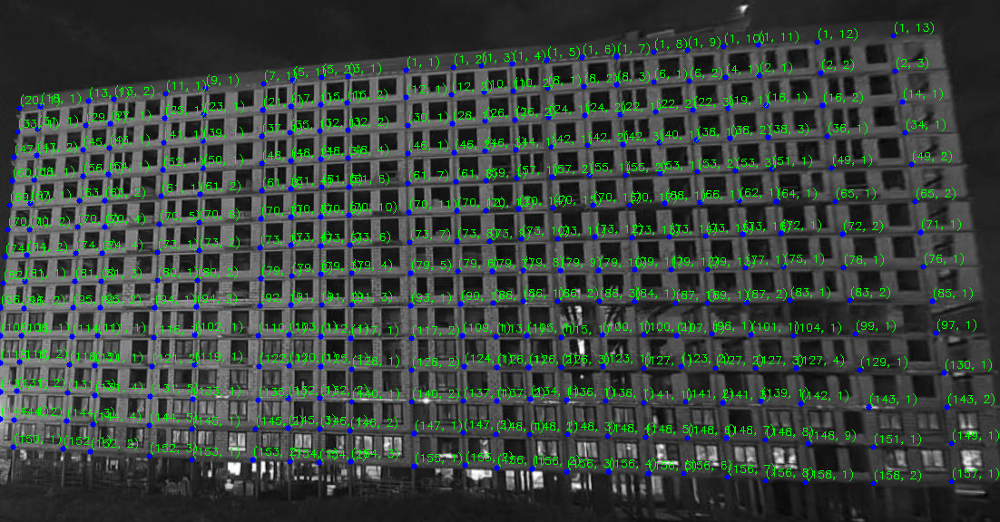

In [ ]:
image_with_points = img.copy()
for row in range(points_arr.shape[0]):
  for column in range(points_arr.shape[1]):
    if (points_arr[row][column]!=None):
      x, y = points_arr[row][column]
      x,y = (int(x*image_with_points.shape[1]),int(y*image_with_points.shape[0]))
      label = str(matrix_arr[row][column])
      cv2.putText(image_with_points, label, (x, y-5), cv2.FONT_HERSHEY_SIMPLEX, 0.4, (0,255,0), 1)

      image_with_points = cv2.circle(image_with_points,(x,y), radius = 3, color = (255,0,0), thickness=-1)
cv2_imshow(image_with_points)

# third algorithm

In [ ]:
# Define the grid cell size (assuming a fixed cell size for the grid)
cell_width = delta_x  # Replace with your actual cell width
cell_height = delta_y  # Replace with your actual cell height

# Sample list of points as (x, y) coordinates
points = bbox_points
# Calculate the row and column indices for each point
row_column_indices = []

for x, y in points:
    col_index = int(x // cell_width)
    row_index = int(y // cell_height)
    row_column_indices.append((row_index, col_index))

# # Print the row and column indices for each point
# for i, (row_index, col_index) in enumerate(row_column_indices, start=1):
#     print(f'Point {i}: Row Index={row_index}, Column Index={col_index}')


# vizualization

In [20]:
img = cv2.imread(image_path)

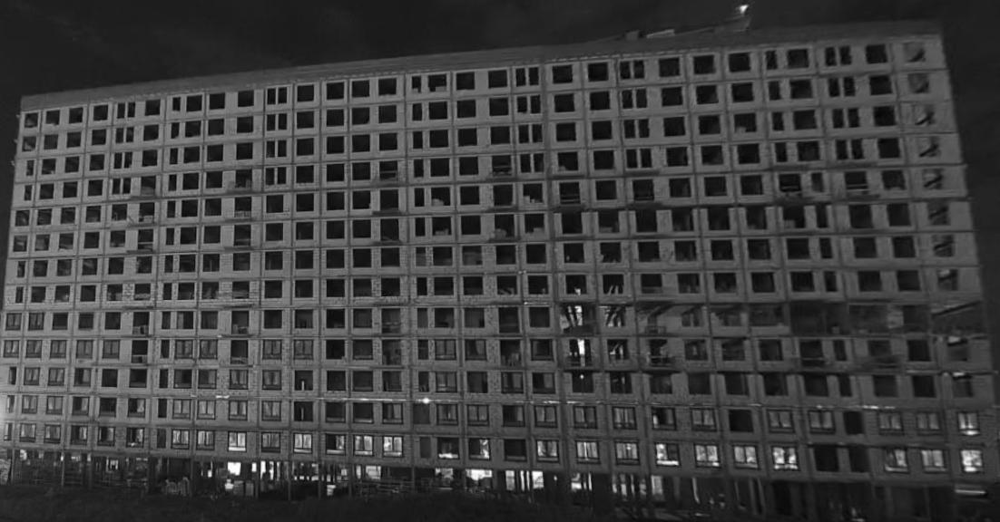

In [15]:
cv2_imshow(img)

In [16]:
points_arr = np.array(points)

NameError: ignored

In [ ]:
len(row_column_indices)

In [ ]:
points_arr.shape

In [ ]:
image_with_points = img.copy()
for i in range(len(points)):
    # if (points_arr[i]!=None):
      x, y = points_arr[i]
      x,y = (int(x*image_with_points.shape[1]),int(y*image_with_points.shape[0]))
      label = str(row_column_indices[i])
      cv2.putText(image_with_points, label, (x, y-5), cv2.FONT_HERSHEY_SIMPLEX, 0.25, (0,255,0), 1)

      image_with_points = cv2.circle(image_with_points,(x,y), radius = 3, color = (255,0,0), thickness=-1)
cv2_imshow(image_with_points)

# fourth alg

In [188]:
# Define the grid cell size (assuming a fixed cell size for the grid)
cell_width = delta_x  # Replace with your actual cell width
cell_height = delta_y  # Replace with your actual cell height

# Sample list of points as (x, y) coordinates
points = bbox_points  # Replace with your list of (x, y) coordinates
# Initialize lists to store row and column indices for each point
row_indices = []
col_indices = []
sorted_points = sorted(points, key=lambda point: point[1]) #sort by y
# Calculate the row and column indices for each point, considering the deformation
for i, (x, y) in enumerate(sorted_points):
    col_index = int(x // cell_width)
    col_indices.append(col_index)



In [205]:
row_indices = []
for i, (x, y) in enumerate(sorted_points):
    row_index = int(y // cell_height)
    if (row_index > 0 and abs(x-sorted_points[i-1][0])>cell_width/2 and abs(x-sorted_points[i-1][0])<cell_width and abs(y-sorted_points[i-1][1])<cell_height ):
      row_index = row_indices[-1]
    row_indices.append(row_index)


In [206]:
len(row_indices)

321

In [207]:
row = pd.DataFrame({'x_min': x_min, 'y_min':y_min, 'row':row_indices})

In [192]:
col = pd.DataFrame({'x_min': x_min, 'y_min':y_min, 'col':col_indices})

In [177]:
row.sort_values('row')

,x_min,y_min,row
0,0.616534,0.108212,1
11,0.873040,0.856736,1
10,0.759165,0.144549,1
8,0.320971,0.470538,1
7,0.648657,0.907830,1
...,...,...,...
300,0.551597,0.282153,15
308,0.655508,0.214288,15
319,0.290880,0.308160,16
318,0.820553,0.140399,16


In [178]:
col.sort_values('col')

,x_min,y_min,col
311,0.014283,0.804514,0
236,0.000181,0.590278,0
46,0.007713,0.439566,0
164,0.033784,0.343872,0
234,0.013122,0.856007,0
...,...,...,...
74,0.920200,0.444618,22
250,0.915363,0.385590,22
167,0.951025,0.849132,23
239,0.951606,0.923524,23


In [47]:
col['col'].unique()

array([14,  8,  9, 19,  3, 15,  7,  0, 18, 21, 17,  4, 11,  6, 10, 20,  2,
       12, 16,  1, 13, 22, 23])

In [179]:
row['row'].unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16])

In [180]:
col_0 = col[(col['col']==0)]

In [181]:
col_0

,x_min,y_min,col
9,0.036506,0.297083,0
41,0.011887,0.346996,0
44,0.027132,0.488976,0
46,0.007713,0.439566,0
52,0.037831,0.247830,0
91,0.019065,0.207552,0
110,0.029093,0.440243,0
114,0.000000,0.803177,0
139,0.017604,0.252621,0
143,0.000000,0.750243,0


In [182]:
row_1 = row[(row['row']==1)]

In [183]:
row_1

,x_min,y_min,row
0,0.616534,0.108212,1
1,0.348294,0.302587,1
2,0.349247,0.412674,1
3,0.409165,0.406493,1
4,0.347904,0.147517,1
5,0.816769,0.080330,1
6,0.150544,0.759896,1
7,0.648657,0.907830,1
8,0.320971,0.470538,1
9,0.036506,0.297083,1


In [103]:
x_1 = np.array(row_1['x_min'])

In [104]:
y_1 = np.array(row_1['y_min'])

In [105]:
y_max_val = max(y_1)

In [106]:
y_min_val = min(y_1)

In [107]:
x_min_val = min(x_1)

In [61]:
# points_0 = [(x_0[i], y_0[i]) for i in range(len(x_0))]

In [108]:
points_1 = [(x_1[i], y_1[i]) for i in range(len(x_1))]

In [63]:
# sorted_points_0 = sorted(points_0, key=lambda point: point[0])

In [109]:
sorted_points_1 = sorted(points_1, key=lambda point: point[0])

In [110]:
y_min_val

0.08032985000000001

In [66]:
# row_indices_col_0 = []
# add=0
# for i, (x, y) in enumerate(sorted_points_0):
#     # print(y, y_min)
#     # print((y) // cell_height, (y-y_min) // cell_height)
#     row_index = int((y-y_min) // cell_height)
#     # while row_index in row_indices_col_0:
#     #   row_index-=1
#     # Calculate the row index based on the deformed y-coordinate

#     row_indices_col_0.append(row_index)

In [111]:
col_indices_row_1 = []
add=0
for i, (x, y) in enumerate(sorted_points_1):
    # col_index = int((x-x_min) // cell_width)
    col_indices_row_1.append(i+1)

In [71]:
col_indices_row_1[0]

1

In [112]:
col_indices_row_1[-1]

12

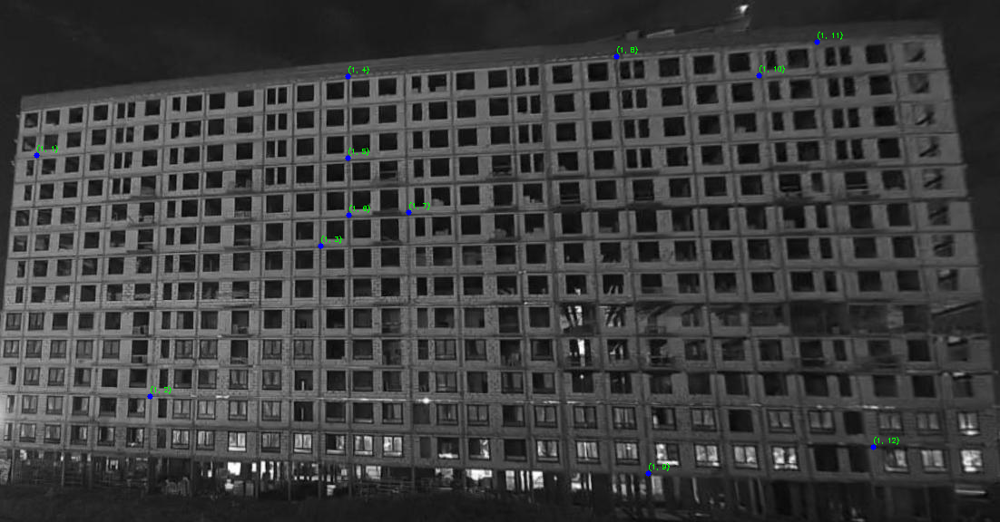

In [113]:
image_with_points = img.copy()
for i in range(len(sorted_points_1)):
    # if (points_arr[i]!=None):
      x, y = sorted_points_1[i]
      x,y = (int(x*image_with_points.shape[1]),int(y*image_with_points.shape[0]))

      label = str((1, col_indices_row_1[i]))#row_indices[i],
      cv2.putText(image_with_points, label, (x, y-5), cv2.FONT_HERSHEY_SIMPLEX, 0.25, (0,255,0), 1)

      image_with_points = cv2.circle(image_with_points,(x,y), radius = 3, color = (255,0,0), thickness=-1)
cv2_imshow(image_with_points)

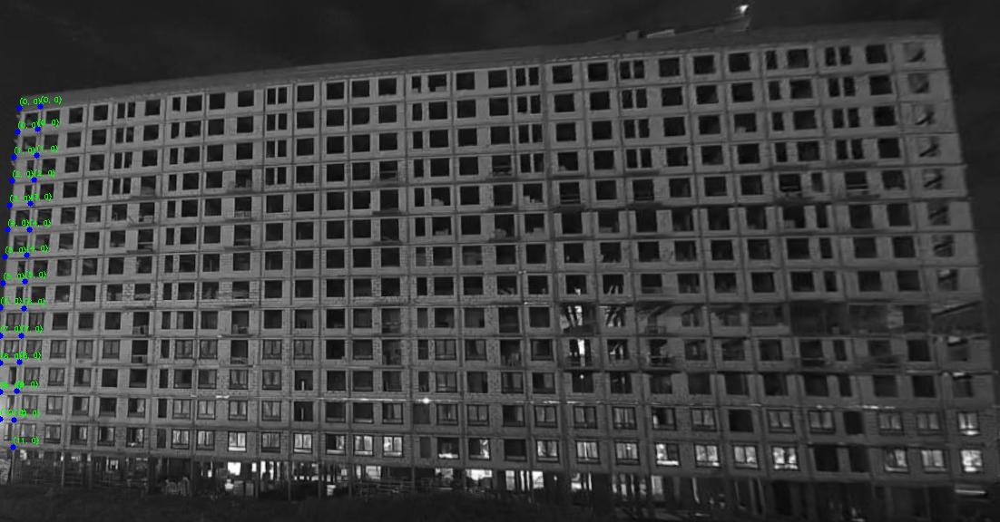

In [130]:
image_with_points = img.copy()
for i in range(len(sorted_points_0)):
    # if (points_arr[i]!=None):
      x, y = sorted_points_0[i]
      x,y = (int(x*image_with_points.shape[1]),int(y*image_with_points.shape[0]))

      label = str((row_indices_col_0[i], 0))#row_indices[i],
      cv2.putText(image_with_points, label, (x, y-5), cv2.FONT_HERSHEY_SIMPLEX, 0.25, (0,255,0), 1)

      image_with_points = cv2.circle(image_with_points,(x,y), radius = 3, color = (255,0,0), thickness=-1)
cv2_imshow(image_with_points)

# viz


In [193]:
img = cv2.imread(image_path)

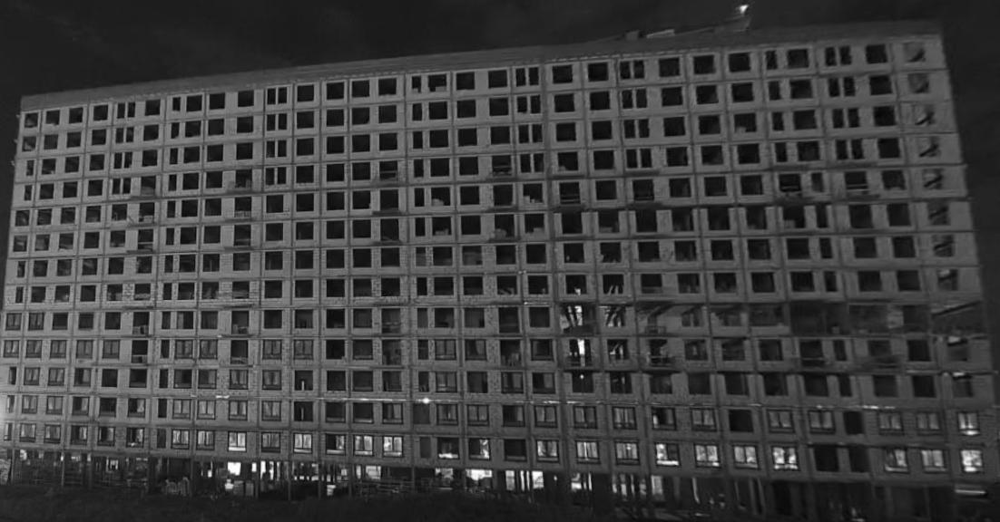

In [194]:
cv2_imshow(img)

In [195]:
points_arr = np.array(points)

In [62]:
points_arr.shape

(321, 2)

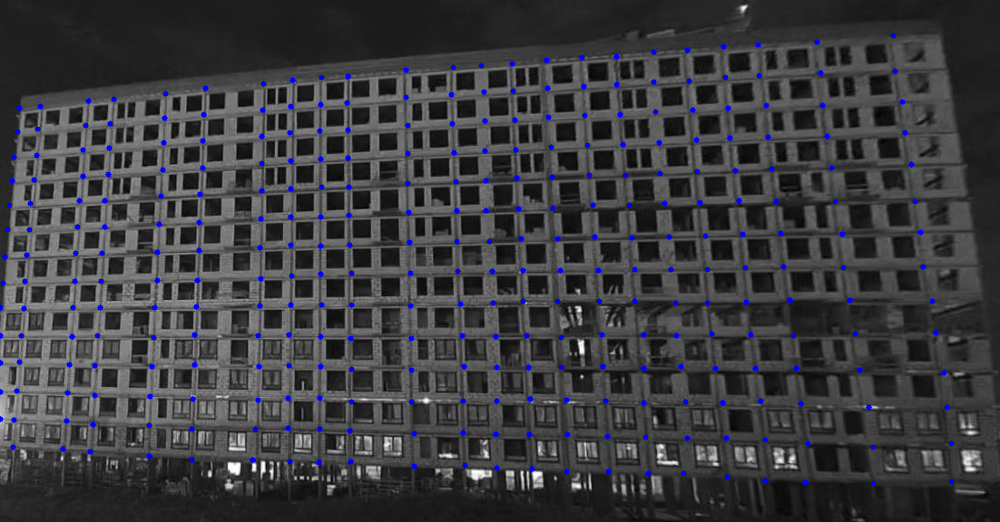

In [235]:
image_with_points = img.copy()
for i in range(len(sorted_points)):
    # if (points_arr[i]!=None):
      x, y = sorted_points[i]
      x,y = (int(x*image_with_points.shape[1]),int(y*image_with_points.shape[0]))

      label = str((row_indices[i], col_indices[i] ))#row_indices[i],
      # cv2.putText(image_with_points, label, (x, y-5), cv2.FONT_HERSHEY_SIMPLEX, 0.25, (0,255,0), 1)

      image_with_points = cv2.circle(image_with_points,(x,y), radius = 3, color = (255,0,0), thickness=-1)
cv2_imshow(image_with_points)

# algorithm 5


In [164]:
def enumerate_points(points):
    rows = []
    current_row = []
    prev_x = None
    prev_y = None
    for x, y in points:
        if len(current_row)>0:
          prev_x = current_row[-1][0]
          prev_y = current_row[-1][1]
        if (prev_x is None and prev_y is None) or (delta_x/2<=abs(x - prev_x) and (abs(y - prev_y)<delta_y/2)) :

            current_row.append((x, y))
        # else:
        #     rows.append(current_row)
        #     current_row = [(x, y)]

    rows.append(current_row)
    print(len(rows))
    enumerated_points = []
    for i, row in enumerate(rows):
        for j, (x, y) in enumerate(row):
            enumerated_points.append(((i+1), (j+1), x, y))

    return enumerated_points

sorted_points = sorted(bbox_points, key=lambda point: point[0]) #sort by x
enumerated_points = enumerate_points(sorted_points)

1


In [165]:
enumerated_points

[(1, 1, 0, 0.80317705),
 (1, 2, 0.06637025, 0.80710065),
 (1, 3, 0.09343005, 0.8127430499999999),
 (1, 4, 0.1494555, 0.81434025),
 (1, 5, 0.1923502, 0.8215277),
 (1, 6, 0.25575315, 0.82124995),
 (1, 7, 0.28813059999999996, 0.8206943999999999),
 (1, 8, 0.3194646, 0.82244785),
 (1, 9, 0.34947364999999997, 0.82590275),
 (1, 10, 0.41388385, 0.8307291),
 (1, 11, 0.4634845, 0.82918395),
 (1, 12, 0.49556265, 0.83171875),
 (1, 13, 0.52914695, 0.8324305),
 (1, 14, 0.5673593, 0.83289925),
 (1, 15, 0.60778585, 0.8352604),
 (1, 16, 0.64573505, 0.83840275),
 (1, 17, 0.6875499, 0.8395833),
 (1, 18, 0.726588, 0.8399131999999999),
 (1, 19, 0.76547185, 0.8428298500000001),
 (1, 20, 0.80794915, 0.84913195),
 (1, 21, 0.87303995, 0.8567361499999999),
 (1, 22, 0.95102545, 0.8491319500000001)]

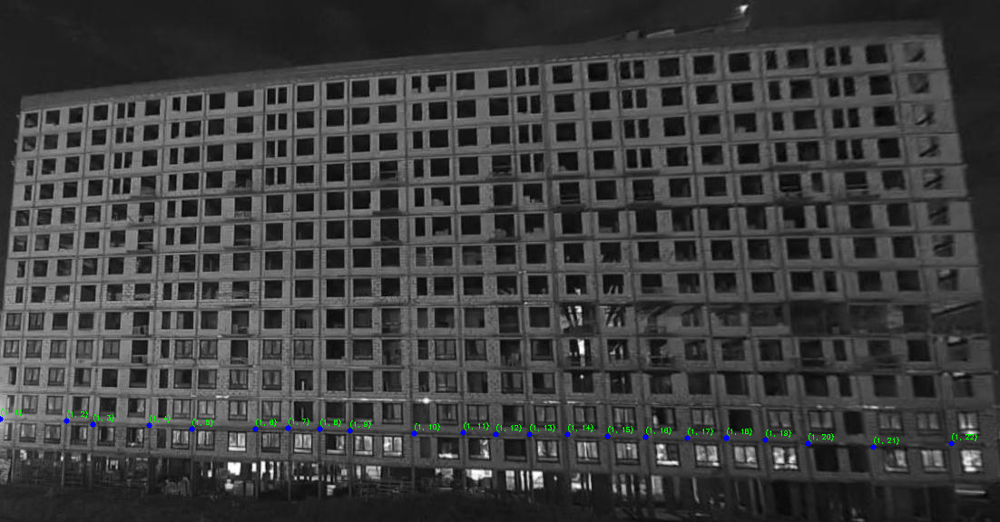

In [170]:
image_with_points = img.copy()
for i, (row, col, x, y ) in enumerate((enumerated_points)):
      x,y = (int(x*image_with_points.shape[1]),int(y*image_with_points.shape[0]))

      label = str((row, col))
      cv2.putText(image_with_points, label, (x, y-5), cv2.FONT_HERSHEY_SIMPLEX, 0.25, (0,255,0), 1)

      image_with_points = cv2.circle(image_with_points,(x,y), radius = 3, color = (255,0,0), thickness=-1)
cv2_imshow(image_with_points)

In [ ]:
def enumerate_points(points):
    rows = []
    current_row = []
    prev_x = None
    prev_y = None
    for x, y in points:
        if len(current_row)>0:
          prev_x = current_row[-1][0]
          prev_y = current_row[-1][1]
        if (prev_x is None and prev_y is None) or (delta_x/2<=abs(x - prev_x) and (abs(y - prev_y)<delta_y/2)) :

            current_row.append((x, y))
        # else:
        #     rows.append(current_row)
        #     current_row = [(x, y)]

    rows.append(current_row)
    print(len(rows))
    enumerated_points = []
    for i, row in enumerate(rows):
        for j, (x, y) in enumerate(row):
            enumerated_points.append(((i+1), (j+1), x, y))

    return enumerated_points

sorted_points = sorted(bbox_points, key=lambda point: point[0]) #sort by x
enumerated_points = enumerate_points(sorted_points)

# alg 6


In [237]:
import numpy as np
import matplotlib.pyplot as plt

# Sample bounding boxes (x_min, y_min, width, height)
bounding_boxes = np.array(data)

# Sort the bounding boxes by their y_min coordinate (top to bottom)
bounding_boxes=sorted(bounding_boxes, key=lambda box: box[1])
# Initialize the grid
grid = []


# Process the bounding boxes
for box in bounding_boxes:
    added = False
    for row in grid:
        prev_box = row[-1] if row else None
        if prev_box and abs(box[1] - prev_box[1]) < delta_y and abs(box[0] - prev_box[0] - prev_box[2]) < delta_x:
            row.append(box)
            added = True
            break
    if not added:
        # If not added to any existing row, create a new row
        grid.append([box])

# Enumerate rows and columns
for row_index, row in enumerate(grid):
    for column_index, box in enumerate(row):
        x_min, y_min, width, height = box
        print(f"Row {row_index}, Column {column_index}: Bounding Box ({x_min}, {y_min})")

# Plot the bounding boxes with labels
fig, ax = plt.subplots()
row_counter = 0
for row in grid:
    column_counter = 0
    for box in row:
        x_min, y_min, width, height = box
        ax.add_patch(plt.Rectangle((x_min, y_min), width, height, fill=False, color='blue'))
        ax.text(x_min, y_min, f"({row_counter}, {column_counter})", fontsize=10, color='red')
        column_counter += 1
    row_counter += 1



# plt.xlim(0, max(box[0] + box[2] for row in grid for box in row) + 10)
# plt.ylim(0, max(box[1] + box[3] for row in grid for box in row) + 10)
plt.xlabel("X-coordinate")
plt.ylabel("Y-coordinate")
plt.grid()
plt.show()











ValueError: ignored

In [ ]:
lg

In [273]:
# Sort points first by y (top to bottom) and then by x (left to right)
sorted_points = sorted(bbox_points, key=lambda point: (point[0]))

# Now, sorted_points contains the points sorted from top to bottom and from left to right
for point in sorted_points:
    print(f"X: {point[0]}, Y: {point[1]}")

X: 0, Y: 0.80317705
X: 0, Y: 0.75024305
X: 0, Y: 0.6951041499999999
X: 0.00018149999999999937, Y: 0.59027775
X: 0.00023584999999999925, Y: 0.6430555
X: 0.0034663999999999997, Y: 0.5425694
X: 0.0049908500000000015, Y: 0.49258675
X: 0.0077132, Y: 0.4395659
X: 0.009283050000000001, Y: 0.39244795000000005
X: 0.0118874, Y: 0.3469965
X: 0.013121550000000003, Y: 0.8560068999999999
X: 0.0142831, Y: 0.80451385
X: 0.014337500000000001, Y: 0.30093745
X: 0.016851199999999997, Y: 0.7493923
X: 0.017604349999999998, Y: 0.2526215
X: 0.0190653, Y: 0.20755205
X: 0.01911065, Y: 0.69404515
X: 0.02094375, Y: 0.6433506999999999
X: 0.0236207, Y: 0.59081595
X: 0.0246642, Y: 0.53909715
X: 0.027132450000000002, Y: 0.48897565000000004
X: 0.0290925, Y: 0.44024304999999997
X: 0.0307622, Y: 0.39041665
X: 0.03378395000000001, Y: 0.34387155
X: 0.036506300000000005, Y: 0.2970833
X: 0.0378312, Y: 0.24782984999999996
X: 0.039990899999999996, Y: 0.2045139
X: 0.0629582, Y: 0.8599132
X: 0.06637025, Y: 0.80710065
X: 0.06777

In [258]:
delta_y_threshold = data.describe()['h']['mean'] # Adjust based on your data

# Initialize variables to keep track of rows and count rows
rows = []
current_row = []
row_count = 0

# Iterate through the sorted points and identify row endings
for i, point in enumerate(sorted_points):
    if i == 0:
        current_row.append(point)
    else:
        # Calculate the difference in y-coordinates between the current point and the previous one
        delta_y = abs(point[1] - sorted_points[i - 1][1])

        if delta_y > delta_y_threshold:
            rows.append(current_row)
            current_row = [point]
            row_count += 1
        else:
            current_row.append(point)

# Don't forget to add the last row if it hasn't been added
if current_row:
    rows.append(current_row)
    row_count += 1

# Now, 'rows' contains a list of rows where each row is a list of points
# 'row_count' contains the number of rows
for i, row in enumerate(rows):
    print(f"Row {i + 1}: {row}")
print(f"Total Rows: {row_count}")

Row 1: [(0.89352995, 0.06892365), (0.81676945, 0.08032985000000001), (0.7583574999999999, 0.0859375), (0.7233303, 0.09013885), (0.68772235, 0.0961805), (0.653902, 0.09994785), (0.6165336, 0.10821175), (0.58255895, 0.10970485), (0.54666055, 0.11498264999999999), (0.5124319, 0.12154509999999999), (0.48178765, 0.12503465), (0.45323955, 0.12913185), (0.4058984, 0.13515625), (0.8953176, 0.13628465), (0.82055345, 0.1403993), (0.75916515, 0.14454865), (0.34790375, 0.1475173), (0.72506355, 0.1484028), (0.32132485, 0.14857635), (0.29279495, 0.15322914999999998), (0.68929215, 0.15515625), (0.6536478499999999, 0.15678815), (0.26362975, 0.16050345), (0.61673315, 0.1628472), (0.5836661, 0.16562495000000002), (0.547441, 0.1694444), (0.20542645, 0.17008675), (0.5133757, 0.17390624999999998), (0.4839201, 0.1768402), (0.16529939999999999, 0.17899305), (0.45146094999999997, 0.18175339999999998), (0.4059891, 0.18630205), (0.11380214999999999, 0.19074655000000001), (0.08803989999999999, 0.1932986), (0.902

In [ ]:
delta_y_threshold = delta_y  # Adjust based on your data

# Initialize variables to keep track of rows and count rows
rows = []
current_row = []
row_count = 0

# Iterate through the sorted points and identify row endings
for i, point in enumerate(sorted_points):
    if i == 0:
        current_row.append(point)
    else:
        # Calculate the difference in y-coordinates between the current point and the previous one
        delta_y = point[1] - sorted_points[i - 1][1]

        if delta_y > delta_y_threshold:
            rows.append(current_row)
            current_row = [point]
            row_count += 1
        else:
            current_row.append(point)

# Don't forget to add the last row if it hasn't been added
if current_row:
    rows.append(current_row)
    row_count += 1

# Now, 'rows' contains a list of rows where each row is a list of points
# 'row_count' contains the number of rows
for i, row in enumerate(rows):
    print(f"Row {i + 1}: {row}")
print(f"Total Rows: {row_count}")

# alg 7

находим ряды

In [37]:
# Define the grid cell size (assuming a fixed cell size for the grid)
cell_width = data.describe()['w']['mean'] # Replace with your actual cell width
cell_height = data.describe()['h']['mean']  # Replace with your actual cell height

# Sample list of points as (x, y) coordinates
points_orig = np.array(data)  # Replace with your list of (x, y) coordinates
# Initialize lists to store row and column indices for each point
points = [point for point in points_orig]
rows = []
ind_to_del = []
while len(points)!=0:
  sorted_points = sorted(points, key=lambda point: point[0]) #sort by x
  row = []
  points = []
  for i, (x, y, w, h) in enumerate(sorted_points):
    if i == 0:
      row.append((x, y, w, h))
    else:
      x_prev = row[-1][0]
      w_prev = row[-1][2]
      y_prev = row[-1][1]
      h_prev = row[-1][3]
      if abs(x - x_prev)>w_prev/2 and abs(x - x_prev)<w_prev*2 and abs(y - y_prev)<h_prev/2:
        row.append((x, y, w, h))
        # ind_to_del.append(i)
      else:
        points.append((x, y, w, h))


  # row_sorted = sorted(row, key=lambda point: point[0]) #sort by x
  # row_col = []
  # for i, (x, y, w, h) in enumerate(row_sorted):
  #   if i == 0:
  #     row_col.append((x,y, w, h))
  #   else:
  #     y_prev = row_col[-1][1]
  #     if abs(y - y_prev)<h :
  #       row_col.append((x, y, w, h))
  print(len(row), len(points))
  rows.append(np.array(row))




30 191
30 161
29 132
29 103
29 74
16 58
16 42
16 26
16 10
10 0


In [39]:
len(rows)

10

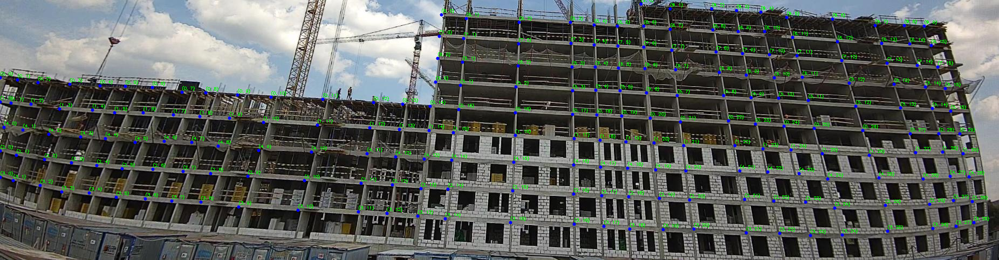

In [40]:
image_with_points = img.copy()
for i in range(len(rows)):
  for j, (x,y, w, h) in enumerate(rows[i]):
    # if (points_arr[i]!=None):
      # x, y = row[i][0], row[i][1]
      x,y = (int(x*image_with_points.shape[1]),int(y*image_with_points.shape[0]))

      label = str((i, j))#row_indices[i],
      cv2.putText(image_with_points, label, (x, y-5), cv2.FONT_HERSHEY_SIMPLEX, 0.25, (0,255,0), 1)

      image_with_points = cv2.circle(image_with_points,(x,y), radius = 3, color = (255,0,0), thickness=-1)
cv2_imshow(image_with_points)

фильтруем ряды по максимумам

In [55]:
rows_sorted = sorted(rows, key=lambda row : np.max(row[:,1]), reverse = True)


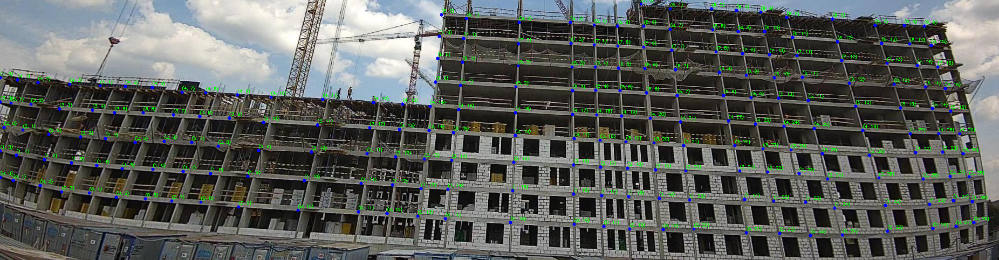

In [56]:
image_with_points = img.copy()
for i in range(len(rows_sorted)):
  for j, (x,y, w, h) in enumerate(rows_sorted[i]):
    # if (points_arr[i]!=None):
      # x, y = row[i][0], row[i][1]
      x,y = (int(x*image_with_points.shape[1]),int(y*image_with_points.shape[0]))

      label = str((i, j))#row_indices[i],
      cv2.putText(image_with_points, label, (x, y-5), cv2.FONT_HERSHEY_SIMPLEX, 0.25, (0,255,0), 1)

      image_with_points = cv2.circle(image_with_points,(x,y), radius = 3, color = (255,0,0), thickness=-1)
cv2_imshow(image_with_points)

находим колонки

In [43]:
# Define the grid cell size (assuming a fixed cell size for the grid)
cell_width = data.describe()['w']['mean'] # Replace with your actual cell width
cell_height = data.describe()['h']['mean']  # Replace with your actual cell height

# Sample list of points as (x, y) coordinates
points_orig = np.array(data)  # Replace with your list of (x, y) coordinates
# Initialize lists to store row and column indices for each point
points = [point for point in points_orig]
columns = []
while len(points)!=0:
  sorted_points = sorted(points, key=lambda point: point[1]) #sort by y
  column = []
  points = []
  for i, (x, y, w, h) in enumerate(sorted_points):
    if i == 0:
      column.append((x, y, w, h))
    else:
      x_prev = column[-1][0]
      w_prev = column[-1][2]
      y_prev = column[-1][1]
      h_prev = column[-1][3]
      if abs(y - y_prev)>h_prev/2 and abs(y - y_prev)<h_prev*2 and abs(x - x_prev)<w_prev/2:
        column.append((x, y, w, h))
      else:
        points.append((x, y, w, h))


  # row_sorted = sorted(row, key=lambda point: point[0]) #sort by x
  # row_col = []
  # for i, (x, y, w, h) in enumerate(row_sorted):
  #   if i == 0:
  #     row_col.append((x,y, w, h))
  #   else:
  #     y_prev = row_col[-1][1]
  #     if abs(y - y_prev)<h :
  #       row_col.append((x, y, w, h))
  print(len(column), len(points))
  columns.append(np.array(column))




10 211
10 201
10 191
10 181
10 171
9 162
10 152
9 143
10 133
9 124
9 115
9 106
10 96
10 86
10 76
9 67
5 62
5 57
5 52
5 47
5 42
5 37
4 33
4 29
4 25
4 21
5 16
5 11
5 6
5 1
1 0


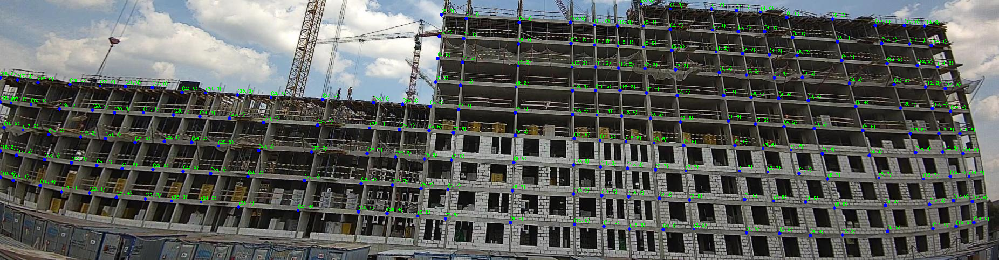

In [44]:
image_with_points = img.copy()
for i in range(len(columns)):
  for j, (x,y, w, h) in enumerate(columns[i]):
    # if (points_arr[i]!=None):
      # x, y = row[i][0], row[i][1]
      x,y = (int(x*image_with_points.shape[1]),int(y*image_with_points.shape[0]))

      label = str((i, j))#row_indices[i],
      cv2.putText(image_with_points, label, (x, y-5), cv2.FONT_HERSHEY_SIMPLEX, 0.25, (0,255,0), 1)

      image_with_points = cv2.circle(image_with_points,(x,y), radius = 3, color = (255,0,0), thickness=-1)
cv2_imshow(image_with_points)

фильтруем колонки

In [45]:
columns_sorted = sorted(columns, key=lambda column : np.max(column[:,0]))


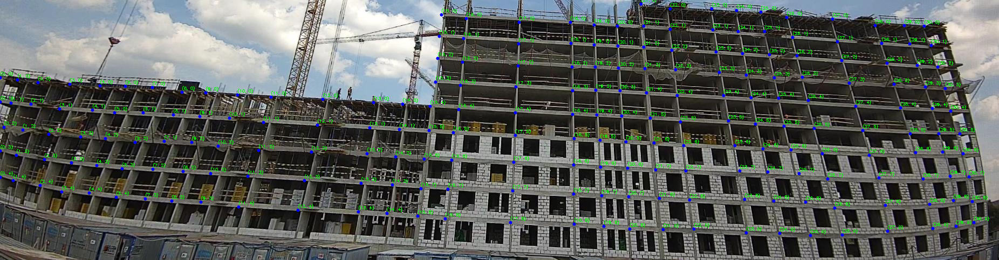

In [46]:
image_with_points = img.copy()
for i in range(len(columns_sorted)):
  for j, (x,y, w, h) in enumerate(columns_sorted[i]):
    # if (points_arr[i]!=None):
      # x, y = row[i][0], row[i][1]
      x,y = (int(x*image_with_points.shape[1]),int(y*image_with_points.shape[0]))

      label = str((i, j))#row_indices[i],
      cv2.putText(image_with_points, label, (x, y-5), cv2.FONT_HERSHEY_SIMPLEX, 0.25, (0,255,0), 1)

      image_with_points = cv2.circle(image_with_points,(x,y), radius = 3, color = (255,0,0), thickness=-1)
cv2_imshow(image_with_points)

объединяем результаты

In [49]:
len(columns_sorted)

31

In [50]:
len(rows_sorted)

10

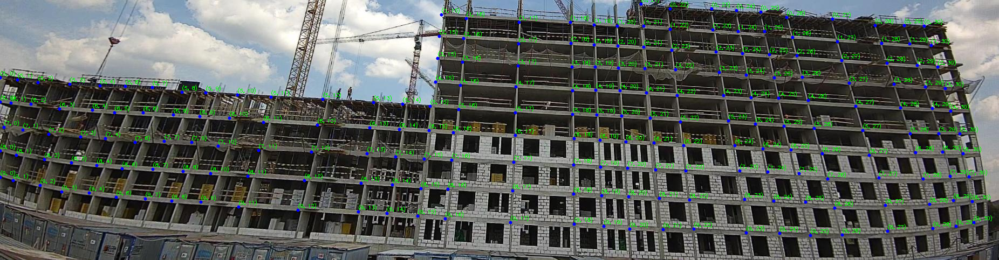

In [53]:
image_with_points = img.copy()

for i in range(len(columns_sorted)):
  for j, (x_c,y_c, w_c, h_c) in enumerate(columns_sorted[i]):
    for k in range(len(rows_sorted)):
      for l, (x_r,y_r, w_r, h_r) in enumerate(rows_sorted[k]):
        if (x_r==x_c and y_r==y_c):
          x,y = (int(x_r*image_with_points.shape[1]),int(y_r*image_with_points.shape[0]))
          label = str((k, i))#row_indices[i],
          cv2.putText(image_with_points, label, (x, y-5), cv2.FONT_HERSHEY_SIMPLEX, 0.3, (0,255,0), 1)
          image_with_points = cv2.circle(image_with_points,(x,y), radius = 3, color = (255,0,0), thickness=-1)
          break
cv2_imshow(image_with_points)


